# Numerical simulation of the wave equation in 1D using Finite Difference

This a *template* notebook that I'm using to create a few slightly different notebooks, each one showing a progression of something new.

The order goes something like this:
1. Normal modes (standing waves) – you already have the notebook I'll use for that (though this template does include all the capability, by uncommenting various parts of the code).
2. Propagating a function (a cosine-squared 'bump'), which shows numerical dispersion if the function is too 'tight' – an addition to above notebook, but there is commented code included in this notebook which can do the same.
3. Examine frequency spectrum of above function (see relevant cells below that plot spectrum), showing max. wavelength that can be reliably propagated (over some distance) with this discretisation is roughly 10-12 cells.  
**NOTE: stage 4 below is the point at which this notebook works as originally given here**
4. Switch to injecting a source function at a gridpoint (rather than setting initial wavefields) – see cells below that create Ricker wavelet with specified peak frequency (can also create a sine-squared 'bump' of some time-scale).
5. Switch on absorbing layers, stage by stage (see notes in cell further down titled "Create absorbing boundaries")
6. ...until we finally have absorbing layers plus 'predictive' boundaries working together!


## Import libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys

----

## Create domain model properties (i.e. speed of waves), and discretisation grid

In [2]:
nx = 800  # 800 gridpoints along the x-axis

# start with homogeneous model - same wave-speed everywhere.
c = np.full(nx,1500.0)  # Note: 1500m/s is typical acoustic velocity of water

# a faster section, halfway across model, to show reflection of waves when crossing sharp interface
c[400:] = 2500.0  # Note: 2500m/s is fairly typical acoustic velocity of sedimentary rock

In [3]:
length = 6000.0  # assign a length to the model in metres

dx = length/nx  # calculate the spatial increment between model parameters

print('Domain is %d grid-cells (%.1fm)' % (nx,length))
print('Grid-spacing (dx) is %.5fm' % (dx))

Domain is 800 grid-cells (6000.0m)
Grid-spacing (dx) is 7.50000m


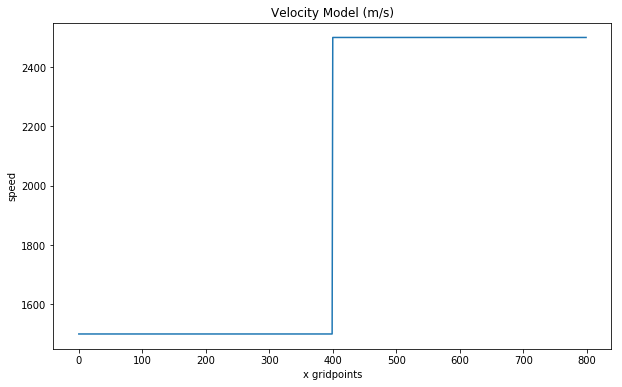

In [4]:
plt.figure(figsize=(10,6))
plt.plot(c) # plotting the velocity model
plt.xlabel('x gridpoints')
plt.ylabel('speed')
plt.title('Velocity Model (m/s)')
plt.show()

----
## Modelling constraints
#### CFL stability condition should be satisfied – the 'Courant number'.

The dimensionless Courant number, $C$, gives a measure of how far a signal will travel across a grid-cell (/between grid-points) within one time-step.
(Hence why I will very often refer to it as 'the crossing factor'.)

The crossing factor is $c$.$\delta t$/$\delta x$ for speed $c$, and we want the maximum value of this within the whole domain to satisfy some constraint that depends upon the finite-difference stencil(s) in use when modelling.

i.e. we want:$\quad \text{max}(c)$.$\delta t/\delta x <= C_{max}$, where $\ C_{max}$ depends on the discretisation.

We can turn this around to find the maximum time-step for our model and grid-spacing, given $C_{max}$ for our discretisation:

$$\delta t_{best} = \frac{C_{max}\ \delta x}{\text{max}(c)}$$

#### This simple stencil (2nd order), with 2nd order time-stepping, for the 1d wave equation, allows max crossing factor to be up to 1.0
(i.e. can only cross up to 100% of a cell in one time-step – but we'll use 80% below.)

In [5]:
C = 0.8  # set the dimensionless max Courant number that we want to use to work out time-step below

In [6]:
time = 5.0  # desired length of the simulation in seconds
dt = (C*dx)/c.max()  # define the best time-step by using the max Courant number
nt = int(time/dt+0.9999)  # find how many steps are needed to cover that time
time = nt*dt  # turn that back into exact time for this number of steps
print('Time-step = %.5fs  Number of steps = %d  (Total time being modelled: %.5fs)' % (dt,nt,dt*nt))

Time-step = 0.00240s  Number of steps = 2084  (Total time being modelled: 5.00160s)


### Create source function (Ricker wavelet with 6Hz peak frequency)

In [7]:
# want to locate the source at some point in the grid
sx = 150  # this is somewhat towards the left side (domain has 800 gridpoints)

The Ricker wavelet used here is a function of time that's defined from the second derivate of a Gaussian function (which is $G(t)=\text{e}^{-a^2 t^2}$).

–It's also known as the Mexican hat wavelet, due to its shape when plotted as a function of two variables.

It can be written so it is symmetric about time zero, with maximum at that time, ultimately decaying towards zero as $t$$\rightarrow$$±\infty$. However, we will shift it in time so that it starts near zero at our time zero.

After differentiating above Gaussian, $G(t)$, twice, flipping, then scaling (and before shifting in time), we get: $\quad R(t) = (1-2a^2 t^2)\ \text{e}^{-a^2 t^2}$

The peak frequency of the Ricker wavelet is at $f$=$a/\pi$.

The length of the wavelet, in time, before it decays close enough to zero for our purposes, is about $\frac{2.1}{f}$ (i.e. about $\frac{1.05}{f}$ seconds each side of the wavelet's central peak).

In [8]:
amp = 1.0  # amplitude of the source function 
freq = 6.0  # peak frequency of source function
ts = 2.1/freq  # desired length of source in time is related to peak frequency
ns = int(ts/dt+0.9999) # figure out how many time-steps are needed to cover that time
ts = ns*dt # and now turn that back into a time that's exactly the required number of steps
print('Length of source is %d steps (%.5f secs, was %.5fs)' % (ns,ts,2.0/freq))

Length of source is 146 steps (0.35040 secs, was 0.33333s)


In [9]:
a2 = (freq*np.pi)**2  # a squared (see equation above)
t0 = ts/2 - dt/2  # midpoint time of wavelet
src = np.zeros(ns)
# create Ricker wavelet (see equation above), offset by time t0 (so midpoint of wavelet is at time t=t0)
for i in range(ns):
    src[i] = amp*( (1 - 2*a2*((i*dt-t0)**2)) * np.exp(-a2*((i*dt-t0)**2)) )
    #src[i] = amp*np.sin((0.5+i)*np.pi/ns)**2  # uncomment to make sine-squared 'bump' instead (not 7Hz peak tho')
print('Endpoint values are: %.6f %.6f' % (src[0],src[-1]))

Endpoint values are: -0.000437 -0.000437


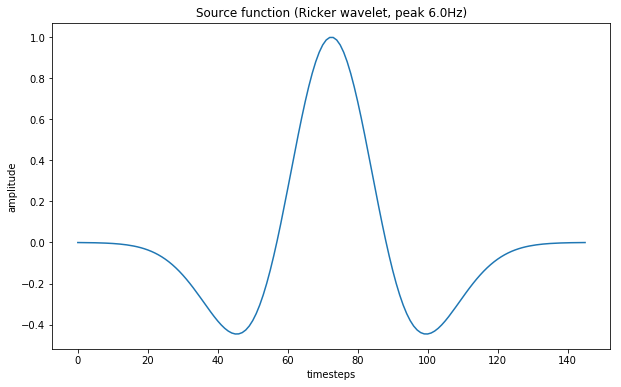

In [10]:
plt.figure(figsize=(10,6))
plt.plot(src) # plot source function
plt.xlabel('timesteps')
plt.ylabel('amplitude')
plt.title('Source function (Ricker wavelet, peak %.1fHz)' % (freq))
plt.show()

### Check that the maximum frequency in the source function can propagate reliably

For a simple second-order finite-difference, the minimum wavelength of a signal that we can propagate reliably is about 10 cells.

In [11]:
# minimum of 10 cells per wavelength for reasonably accurate propagation (i.e. minimal numerical dispersion):
min_cells_per_wl = 10.0

# calculate the max frequency that can be modelled without numerical dispersion:
max_freq = c.min()/(min_cells_per_wl*dx)

print('Maximum reliable propagation frequency is about %.1fHz' % max_freq)

Maximum reliable propagation frequency is about 20.0Hz


#### Want to avoid causing too much dispersion by keeping maximum significant frequency within this limit...

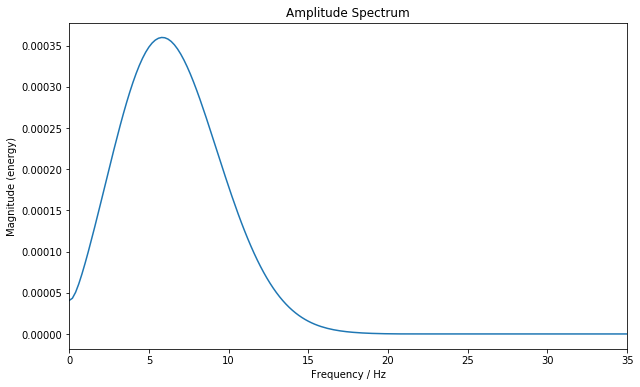

In [12]:
# plot amplitude spectrum of source function
plt.figure(figsize=(10,6))
plt.magnitude_spectrum(np.append(src,np.zeros(nt-ns)), Fs=1/dt)  # note padding to nt points
plt.title('Amplitude Spectrum')
plt.xlim(0,35)
plt.xlabel('Frequency / Hz')
plt.show()

----
## Create absorbing boundaries

There are two parts to the absorbing boundary we creat here. **Instructions below** show how we will work through them...

1. Both parts start switched OFF (since the "absfact" and 'predfact' values are set to zero in later cells), to show how doing nothing at boundaries naturally produces a reflection.

2. Then comment out the line that sets "absfact" to zero (see below the absorption model figure), and try the CONSTANT case of the absorbing layer (i.e. don't run the other two). That shows how it also leads to some reflection from the start of the absorbing layer.
  
3. Then use the "LINEAR" case instead, so it ramps into the absorbing layer, showing that it reduces this reflection. –Be sure to use the value of "absfact" which is for *no predictive boundary*. 

4. Then use the "QUADRATIC" case, which is better still. (Again, use the non-predictive value for "absfact".)

5. At this point, switch off the absorbing layer again, and switch on the 'predictive' boundary, switching to the 'predfact' values of 1.0. This is not an absorbing layer, but simply uses a 'prediction' for the gridpoints at the edges of the domain, based on the assumption that the wave is travelling in one direction (outwards) at known speed ($c$). This does a pretty decent job, considering it doesn't require any extra gridpoints for absorbing.

6. Then switch on the absorbing layer again, and see how that works together with predictive.

7. Since the 'predictive' condition reduces the reflection, the absorbing layer can also be reduced in intensity – so switch back to the value of "absfact" for use with the predictive condition.

8. Finally, since the absorbing layer changes the behaviour at the boundary (the wavefront is decaying as it propagates out), we can tweak the predictive condition by reducing its strength a tiny bit – i.e. switch to the 'predfact' values for use *with* absorbing layer.

In [13]:
# want layer at both sides of the model to be 60 cells thick
abswid = 60

Choose one of the following three absorbing models to try (i.e. just run one of the three cases)

In [14]:
# CONSTANT

a = np.zeros(nx)  # initialise array with zeros

a[:abswid]  = 1.0  # left layer
a[-abswid:] = 1.0  # right layer

absfact = 0.04

In [15]:
# LINEAR

a = np.zeros(nx)  # initialise array with zeros

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i]   = 1.0*i/abswid  # linear increase towards left boundary
    a[i-abswid-1] = 1.0*i/abswid  # linear increase towards right boundary

absfact = 0.08  # use this value when there is no predictive boundary
#absfact = 0.04  # uncomment this when using with predictive boundary

In [16]:
# QUADRATIC

a = np.zeros(nx)  # initialise array with zeros

absw2 = abswid*abswid  # useful shorthand

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i]   = 1.0*i*i/absw2  # quadratic increase towards left boundary
    #a[i-abswid-1] = 1.0*i*i/absw2  # quadratic increase towards right boundary

# try 80 cells instead for absorbing layer on right side
for i in range(1,81):
    a[i-81] = 1.0*i*i/(80*80)  # quadratic increase towards right boundary

absfact = 0.1  # use this value when there is no predictive boundary
absfact = 0.04  # uncomment this when using with predictive boundary

#### Show the absorption model (before scaling by model)

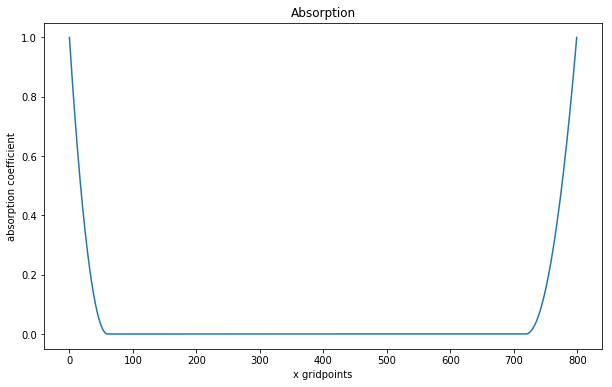

In [17]:
plt.figure(figsize=(10,6))

plt.title('Absorption')

plt.plot(a)
plt.xlabel('x gridpoints')
plt.ylabel('absorption coefficient')
plt.show()

Finish by scaling with velocity and other factors, for direct use in simulation later

In [18]:
#absfact = 0.0  # COMMENT THIS to retry with absorbing layers switched on!

a[:] = a[:]*c[:]*(dt/dx)*absfact

## Predictive boundary condition

In [19]:
# set up crossing-factors for use at edges with 'predictive' boundary condition
C_xmin = c[0]*dt/dx
C_xmax = c[-1]*dt/dx

# for use without absorbing layer
predfact_xmin = 1.0
predfact_xmax = 1.0

# for use with absorbing layer
predfact_xmin = 0.99
predfact_xmax = 0.98

# COMMENT THESE to retry with predictive boundary switched on!
#predfact_xmin = 0.0
#predfact_xmax = 0.0

## Receiver points within domain
–To detect what crosses a few particular points of the domain over time

In [20]:
rpos = np.array([70,100,640])  # put receivers at various grid-points in domain
r = np.zeros((rpos.shape[0],nt))  # an array to store 3 sets of receiver data every step (and to plot later)

----
# Simulation

In [21]:
# Initialise arrays for wavefields
u = np.zeros(nx) # current wavefield
u_prv = np.zeros(nx) # previous wavefield, at t-1
u_nxt = np.zeros(nx) # next wavefield, at t+1


# For standing waves (uncomment to use this, ensure chunk below, for propagating function, is commented out)...
#
#mode = 3.0  # this changes the number of peaks+troughs across the domain (also changes oscillation frequency)
#
#for ix in range(nx):
#    u_prv[ix] = np.sin(mode*np.pi*ix/(nx-1))  # initial sine wave:  u(x,0) = sin(nπx/L)
#
# need two wavefields to start time-steps, so this is second step:  u(x,dt) = sin(nπx/L).cos(nπc.dt/L)
#u[:] = u_prv[:]*np.cos(mode*np.pi*c[:]*dt/length)


# For propagating cos-squared-shape function (uncomment to use this, comment above standing waves chunk)...
# NOTE: also must comment out injection of source function in the time-stepping cell below!
#
# Initialise wavefields to produce a propagating function, done the 'easy way' (i.e. without trying to
# work out the actual gridpoint bounds that would avoid going through the whole domain range)
# Use it to demontrate numerical dispersion (when the function is too short, i.e. 'sw' ought to be increased)
#
#sw = 20  # width of the cos-squared function (in grid-points), this is short enough to show numerical dispersion
#
# fill in cos-squared function for first wavefield, centred on gridpoint given by sx:
#for ix in range(nx):
#    if abs(ix-sx)<sw/2:
#        u_prv[ix] = np.cos(np.pi*(ix-sx)/sw)**2
#
# need to 'shift' function to the right by the crossing factor, C (which was worked out above), for 2nd wavefield
# note this assumes C is constant across whole grid (or at least is correct over range of this initialisation):
#for ix in range(nx):
#    if abs(ix-sx-C)<sw/2:
#        u[ix] = np.cos(np.pi*(ix-sx-C)/sw)**2


# plot the initial wavefields...
#
#fig = plt.figure(figsize=[15,7])
#plt.plot(u_prv)
#plt.plot(u)
#plt.title('Initial wavefields')
#plt.show()

In [22]:
# prepare an array to store wavefield snapshots for plotting
sampling_rate = 5 # set sampling rate used to store wavefield (every 10 timesteps)
wavefield = np.zeros((int(nt/sampling_rate), nx)) # array to store wavefields every 10 timesteps
print('Storing %d wavefields (every %dth out of %d)' % (wavefield.shape[0],sampling_rate,nt))

Storing 416 wavefields (every 5th out of 2084)


In [23]:
# a useful variable – shorthand for something that appears regularly in expressions below
dtdx2 = (dt*dt)/(dx*dx)

In [24]:
u[sx] = src[0] #*dtdx2*(c[sx]**2)  # put first source entry into current wavefield

# begin time-stepping loop...

for i in range(nt):

    if i%20==0:
        sys.stdout.write('Done step %d of %d\r' % (i+1,nt))

    # find new wavefield, u_new, throughout domain (apart from edges)
    # NOTE: no vectorisation, so it's slow!
    for ix in range(1,nx-1):
        u_nxt[ix] = ( (c[ix]**2) * dtdx2 * (u[ix-1]-2*u[ix]+u[ix+1]) \
                    + (2-a[ix]**2)*u[ix] - u_prv[ix]*(1-a[ix]) ) / (1+a[ix])

    # NOTE: uses vectorisation, so it's much faster!
    #u_nxt[1:-1] = ( (c[1:-1]**2) * dtdx2 * (u[:-2]-2*u[1:-1]+u[2:]) \
    #                + (2-a[1:-1]**2)*u[1:-1] - u_prv[1:-1]*(1-a[1:-1]) ) / (1+a[1:-1])

    
    # find u_new for left and right edges using 'predictive' boundary condition
    u_nxt[0]  = ( u[0]*(1.0-C_xmin) +  u[1]*C_xmin)*predfact_xmin
    u_nxt[-1] = (u[-1]*(1.0-C_xmax) + u[-2]*C_xmax)*predfact_xmax

    # put in source function as if it's a 'forced' boundary condition (rather than injecting by adding),
    # up until the source function runs out of steps
    if i+1<ns:
        u_nxt[sx] = src[i+1] #*dtdx2*(c[sx]**2)

    r[:,i] = u_nxt[rpos[:]]  # record values at receiver points

    # shift wavefields for next time-step
    u_prv[:] = u[:]
    u[:] = u_nxt[:]
    
    # store the current wavefield u on every Nth step (where N=sampling_rate, as defined earlier)
    if (i+1)%sampling_rate == 0:
        wavefield[int((i+1)/sampling_rate-1),:] = u[:]

print('Finished all %d steps' % (nt))

Finished all 2084 steps


## Plot wavefield at different times

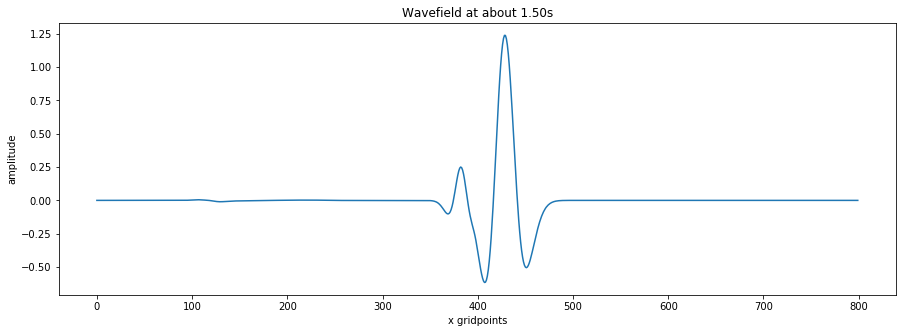

In [25]:
plot_time = 1.5  # 1.5 seconds
plt.figure(figsize=(15,5))
plt.plot(wavefield[int(plot_time/(dt*sampling_rate)),:])
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.xlabel('x gridpoints')
plt.ylabel('amplitude')
plt.show()

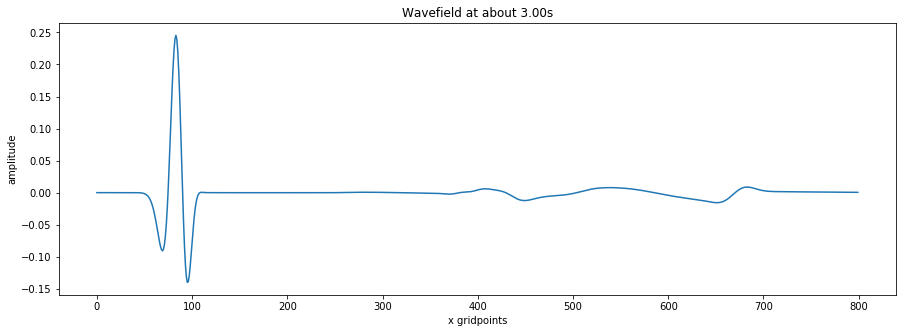

In [26]:
plot_time = 3.0  # 3 seconds
plt.figure(figsize=(15,5))
plt.plot(wavefield[int(plot_time/(dt*sampling_rate)),:])
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.xlabel('x gridpoints')
plt.ylabel('amplitude')
plt.show()

## Plot data at receivers

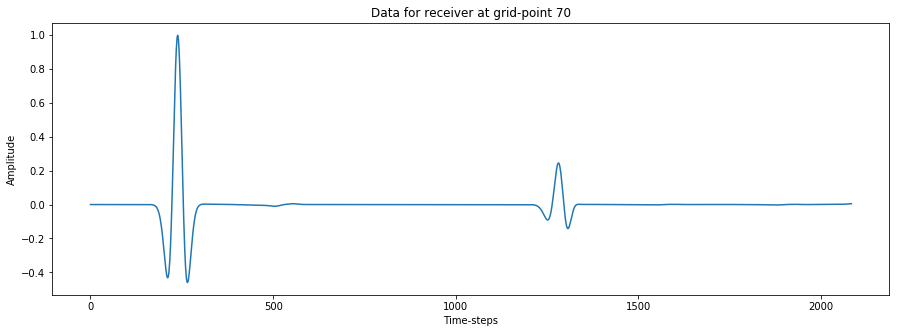

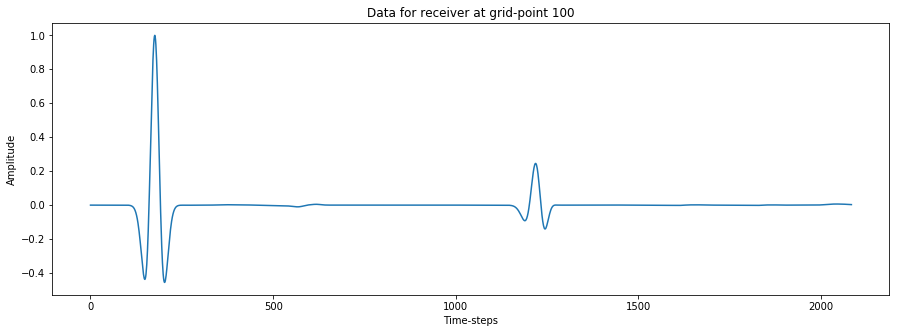

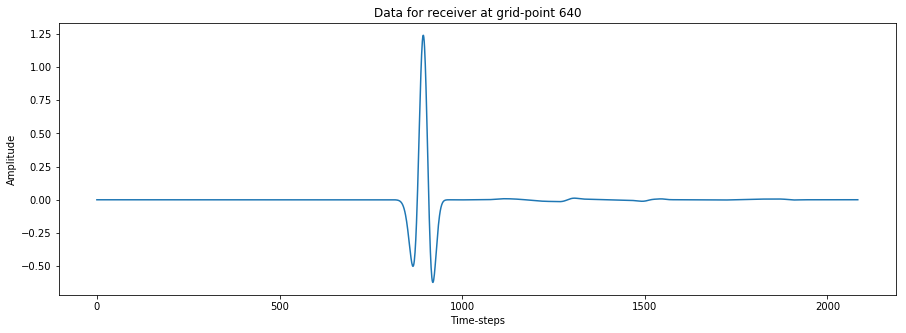

In [27]:
for i in range(r.shape[0]):
    plt.figure(figsize=(15,5))
    plt.plot(r[i])
    plt.title('Data for receiver at grid-point %d' % (rpos[i]))
    plt.ylabel('Amplitude')
    plt.xlabel('Time-steps')
    plt.show()

## Show space-time plot for whole wavefield

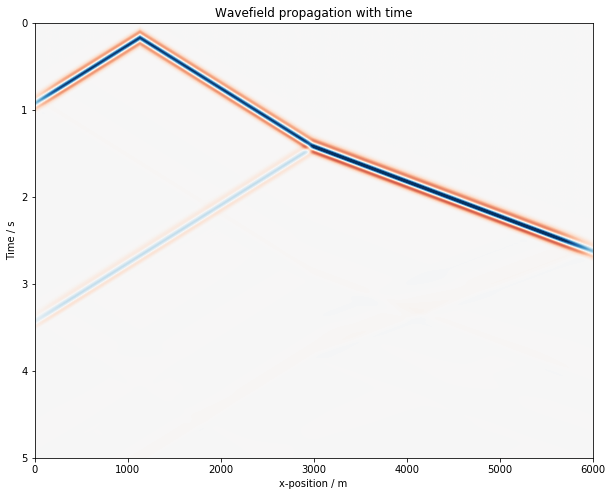

In [28]:
fig = plt.figure(figsize=(10,8))
plt.imshow(wavefield, cmap='RdBu', interpolation='bilinear', aspect='auto',
           vmin=-1, vmax=1,       # set the bounds for the colour data
           extent=(0,length,time,0))  # set the bounds for the axes
plt.title('Wavefield propagation with time')
plt.xlabel('x-position / m')
plt.ylabel('Time / s')
plt.show()

## Make a movie! 

In [29]:
#plt.ioff()

fig, ax = plt.subplots(figsize=(15,6))

x = np.arange(0, wavefield.shape[1], 1)
line, = ax.plot(x,wavefield[0])

plt.title('Wavefield')
plt.xlabel('x gridpoint')
plt.ylabel('amplitude')
plt.ylim(-1.3,1.3)

#def init():  # only required for blitting to give a clean slate.
#    line.set_ydata(wavefield[0])
#    return line,

def frame(i):
    line.set_ydata(wavefield[i])
    return line,

print('Finished plots for frames, building animation...')

#ani = anim.FuncAnimation(fig, frame, init_func=init, interval=50, blit=True, save_count=wavefield.shape[0])
ani = anim.FuncAnimation(fig, frame, interval=50, save_count=wavefield.shape[0])

plt.close(fig)  # prevent final image from showing up inline just below

print('Preparing HTML (takes a little while...)')

HTML(ani.to_jshtml())

Finished plots for frames, building animation...
Preparing HTML (takes a little while...)
